# Test Unlabeled Spectrograms (Multiclass)

This notebook loads a multiclass classifier and predicts labels for unlabeled spectrograms from `.mat` files. It reports label distributions, per-hydrophone breakdowns, and shows example spectrograms per predicted label and for multi-label cases.


In [1]:
# Env check and imports
import sys
import os
import pickle
from pathlib import Path

import numpy as np
import torch
import scipy.io as sio
import h5py
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import pandas as pd

print(f"Python: {sys.version}")
print(f"CUDA available: {torch.cuda.is_available()}")

# Add src to path
repo_root = Path.cwd().parent
if str(repo_root) not in sys.path:
    sys.path.append(str(repo_root))

from src.ssamba.utilities.training_utils import create_model
from src.ssamba.dataset import ONCSpectrogramDataset
from src.ssamba.utilities.spectrogram_utils import (
    load_mat_spectrogram,
    normalize_spectrogram,
    preprocess_to_tensor,
    preprocess_to_tensor_ctf,
    preprocess_with_resize_ctf,
    resize_to_target,
)
from src.ssamba.utilities.inference_utils import build_mat_dataloader, run_inference_multiclass, build_mat_dataloader_h5like



Python: 3.10.12 (main, Jan 17 2025, 14:35:34) [GCC 11.4.0]
CUDA available: True


/home/sbialek/ONC/selfsupervision_anomalies_onc/.venv/lib/python3.10/site-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/home/sbialek/ONC/selfsupervision_anomalies_onc/.venv/lib/python3.10/site-packages/timm/models/registry.py:4: FutureWarning: Importing from timm.models.registry is deprecated, please import via timm.models
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.models", FutureWarning)


VisionMamba imported successfully
RMSNorm imported successfully


In [2]:
# Config

# MAT_FILES_DIR = "/mnt/z/CIOOS_Anomaly_detection_work/EndeavourKEMFHH1/testset/ICLISTENHF6324/sampling_2024-11-20_to_2025-06-24/mat/processed/"
MAT_FILES_DIR = "/mnt/z/CIOOS_Anomaly_detection_work/EndeavourKEMFHH1/matfiles/"
MODEL_DIR = Path("/home/sbialek/ONC/selfsupervision_anomalies_onc/data/trained-model/finetune/amba-base-f16-t16-b16-lr1e-4-m300-custom-tr0.8-fir_experiment_multiclass_avgtok2")
CHECKPOINT_PATH = MODEL_DIR / "models/ft-avgtok_best_checkpoint.pth"
OUTPUT_DIR = Path("test_results_multiclass")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

TARGET_SIZE = (512, 512)       # h, w
EXPECTED_SHAPE = (854, 1000)   # raw .mat shape
BATCH_SIZE = 4

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Device:", device)


Device: cuda


In [3]:
# Load model and derive class names from args/dataset

# Load args.pkl
with open(MODEL_DIR / 'args.pkl', 'rb') as f:
    args = pickle.load(f)

# Make sure multiclass is on
args.multiclass = True

args.exp_dir = MODEL_DIR

# Create and load model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = create_model(args)
model = model.to(device)

# Load checkpoint
checkpoint = torch.load(CHECKPOINT_PATH, map_location=device)
if 'model_state_dict' in checkpoint:
    state_dict = checkpoint['model_state_dict']
else:
    state_dict = checkpoint

model.load_state_dict(state_dict)
model.eval()

# Build a tiny dataset instance to recover label mapping
# Use data path from args if available; otherwise construct from config
probe_data_path = "/home/sbialek/ONC/selfsupervision_anomalies_onc/data/different_locations_incl_backgroundpipelinenormals_multilabel.h5"

probe_ds = ONCSpectrogramDataset(
    data_path=probe_data_path if probe_data_path else str(MODEL_DIR),
    split='test',
    train_ratio=getattr(args, 'train_ratio', 0.8),
    val_ratio=getattr(args, 'val_ratio', 0.1),
    seed=getattr(args, 'split_seed', 42),
    target_length=getattr(args, 'target_length', 1024),
    num_mel_bins=getattr(args, 'num_mel_bins', 128),
    supervised=True,
    subsample_test=False,
    multiclass=True,
    num_classes=getattr(args, 'num_classes', 8),
)
# Trigger mapping
_ = probe_ds[0]
class_names = [probe_ds.index_to_label[i] for i in range(len(probe_ds.index_to_label))]
print("Classes:", class_names)


Vision Mamba Config: {'img_size': (512, 512), 'patch_size': 16, 'stride': 16, 'embed_dim': 768, 'depth': 24, 'channels': 1, 'num_classes': 8, 'drop_rate': 0.0, 'drop_path_rate': 0.1, 'norm_epsilon': 1e-05, 'rms_norm': False, 'residual_in_fp32': False, 'fused_add_norm': False, 'if_rope': False, 'if_rope_residual': False, 'bimamba_type': 'v2', 'if_cls_token': True, 'if_devide_out': True, 'use_double_cls_token': False, 'use_middle_cls_token': False, 'if_bidirectional': True, 'final_pool_type': 'none', 'if_abs_pos_embed': True, 'if_bimamba': False}
Loading pretrained model from: /scratch/merileo/exp/pretrain/amba-base-f16-t16-b16-lr1e-4-m300-custom-tr0.8-full_dataset_hydrophones_FINAL/models/pretrain-joint_best_checkpoint.pth
Loaded state dict keys: dict_keys(['epoch', 'global_step', 'model_state_dict', 'optimizer_state_dict', 'scheduler_state_dict', 'best_metrics', 'val_acc', 'args'])
Now loading SSL pretrained model from /scratch/merileo/exp/pretrain/amba-base-f16-t16-b16-lr1e-4-m300-cus

In [5]:
# Collect .mat files and run inference

mat_paths = sorted([str(p) for p in Path(MAT_FILES_DIR).glob('**/*.mat')])
print(f"Found {len(mat_paths)} .mat files")

data_loader = build_mat_dataloader_h5like(
    paths=mat_paths,
    expected_shape=EXPECTED_SHAPE,
    target_size=(512, 512),
    batch_size=BATCH_SIZE,
    num_workers=4,
    dataset_mean=getattr(args, 'dataset_mean', None),
    dataset_std=getattr(args, 'dataset_std', None),
    amount=1.0 if getattr(args, 'amount', None) is None else getattr(args, 'amount')
)
_, preds, probs, sources = run_inference_multiclass(
    model=model,
    data_loader=data_loader,
    device=device,
    task=getattr(args, 'task', 'ft_cls'),
    show_progress=True,
    desc='unlabeled inference'
)

# Build DataFrame of predictions
results = pd.DataFrame({
    'path': mat_paths[:len(preds)],
    'pred_index': preds,
    'pred_label': [class_names[i] for i in preds],
})

# Top-k predictions
K = 3
order = np.argsort(-probs, axis=1)
for k in range(K):
    results[f'top{k+1}_index'] = order[:, k]
    results[f'top{k+1}_label'] = [class_names[i] for i in order[:, k]]
    results[f'top{k+1}_prob'] = probs[np.arange(len(probs)), order[:, k]]

results.to_csv(OUTPUT_DIR / 'predictions.csv', index=False)
results.head()


Found 1085 .mat files


unlabeled inference:   0%|          | 0/272 [00:00<?, ?batch/s]

,path,pred_index,pred_label,top1_index,top1_label,top1_prob,top2_index,top2_label,top2_prob,top3_index,top3_label,top3_prob
0,/mnt/z/CIOOS_Anomaly_detection_work/EndeavourK...,1,Anomaly,1,Anomaly,0.950618,0,normal,0.021462,4,Engine Noise,0.016046
1,/mnt/z/CIOOS_Anomaly_detection_work/EndeavourK...,1,Anomaly,1,Anomaly,0.912555,4,Engine Noise,0.033404,0,normal,0.029801
2,/mnt/z/CIOOS_Anomaly_detection_work/EndeavourK...,1,Anomaly,1,Anomaly,0.951332,0,normal,0.020891,4,Engine Noise,0.015629
3,/mnt/z/CIOOS_Anomaly_detection_work/EndeavourK...,1,Anomaly,1,Anomaly,0.959802,0,normal,0.013047,4,Engine Noise,0.012244
4,/mnt/z/CIOOS_Anomaly_detection_work/EndeavourK...,1,Anomaly,1,Anomaly,0.950676,0,normal,0.021402,4,Engine Noise,0.016030


In [6]:
# Multi-label thresholding with per-class thresholds from validation

# per-class thresholds from validation results - these work better than global
per_class_thresholds = np.array([
    0.61,  # normal
    0.02,  # Anomaly
    0.52,  # Data Gap
    0.09,  # Dropout
    0.45,  # Engine Noise
    0.03,  # Rain
    0.03,  # Sensitivity
    0.04   # Tonal
])

# Binary matrix of predicted labels with per-class thresholds
y_pred_bin = (probs >= per_class_thresholds.reshape(1, -1)).astype(int)

# Count how many labels predicted per sample
results['num_labels_pred'] = y_pred_bin.sum(axis=1)

# Summaries
label_counts = pd.Series(results['pred_label']).value_counts().reindex(class_names, fill_value=0)
label_counts_df = label_counts.reset_index(name='count').rename(columns={'index': 'label'})

label_counts_df


,pred_label,count
0,normal,1004
1,Anomaly,67
2,Data Gap,7
3,Dropout,2
4,Engine Noise,4
5,Rain,0
6,Sensitivity,0
7,Tonal,1


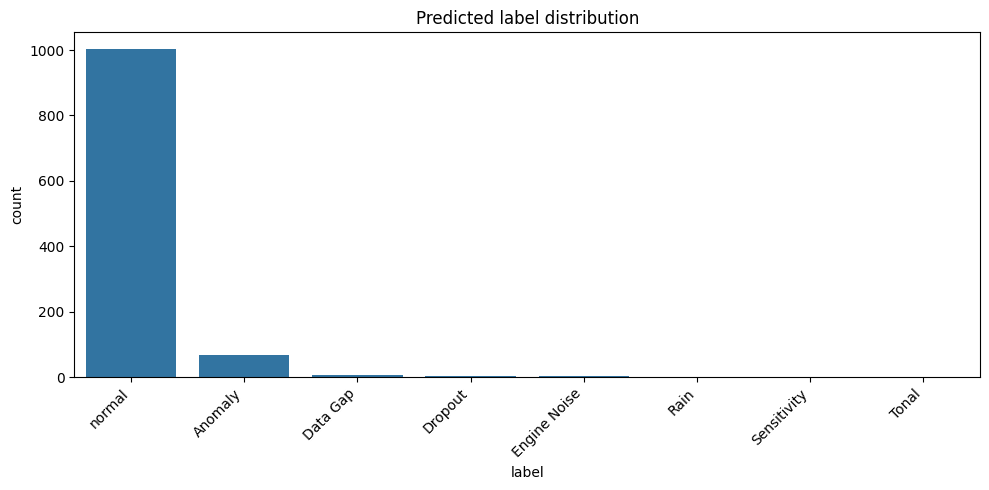

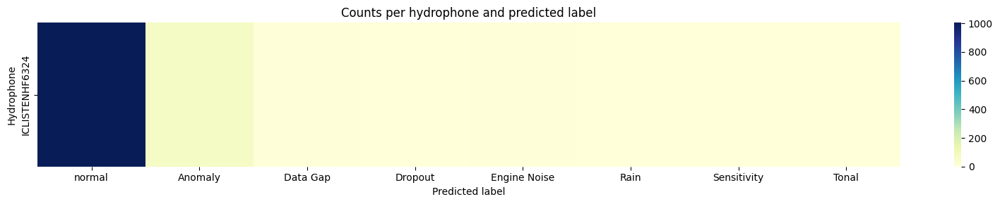

In [7]:
# Plots: label distribution and per-hydrophone breakdown (if hydrophone can be parsed from path)

# Be robust to column names: allow either 'label' or 'pred_label'
df_plot = label_counts_df.copy()
if 'label' not in df_plot.columns and 'pred_label' in df_plot.columns:
    df_plot = df_plot.rename(columns={'pred_label': 'label'})

# Ensure ordering matches class_names and fill any missing labels with zero
if 'label' in df_plot.columns and 'count' in df_plot.columns:
    df_plot = df_plot.set_index('label').reindex(class_names, fill_value=0).reset_index()

plt.figure(figsize=(10, 5))
sns.barplot(data=df_plot, x='label', y='count')
plt.title('Predicted label distribution')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Try to parse hydrophone name from filename (before first underscore)
paths_series = results['path'].astype(str)
hydros = paths_series.apply(lambda p: Path(p).name.split('_')[0] if '_' in Path(p).name else None)
results['hydrophone'] = hydros

hydro_label_counts = results.groupby(['hydrophone', 'pred_label']).size().reset_index(name='count')

# Pivot to heatmap
pivot = hydro_label_counts.pivot(index='hydrophone', columns='pred_label', values='count').fillna(0).reindex(columns=class_names, fill_value=0)
plt.figure(figsize=(1.5*len(class_names)+4, 0.5*max(6, len(pivot.index))))
sns.heatmap(pivot, annot=False, cmap='YlGnBu')
plt.title('Counts per hydrophone and predicted label')
plt.xlabel('Predicted label')
plt.ylabel('Hydrophone')
plt.tight_layout()
plt.show()


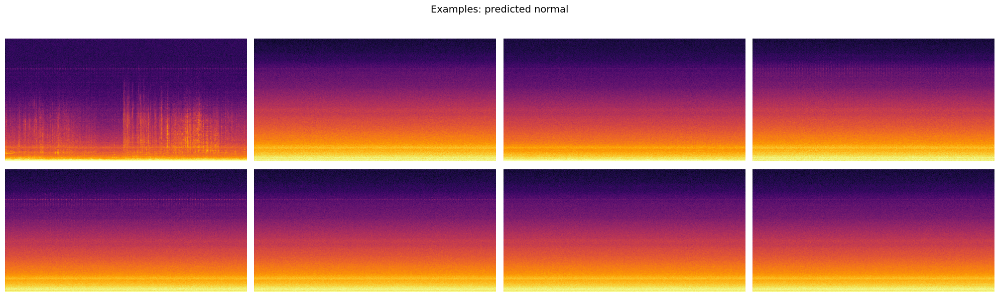

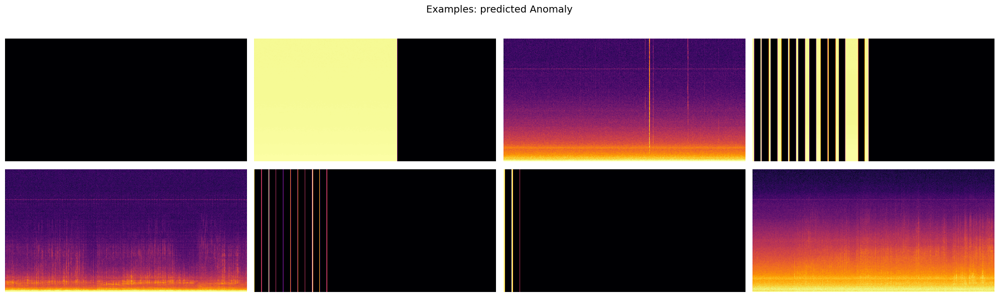

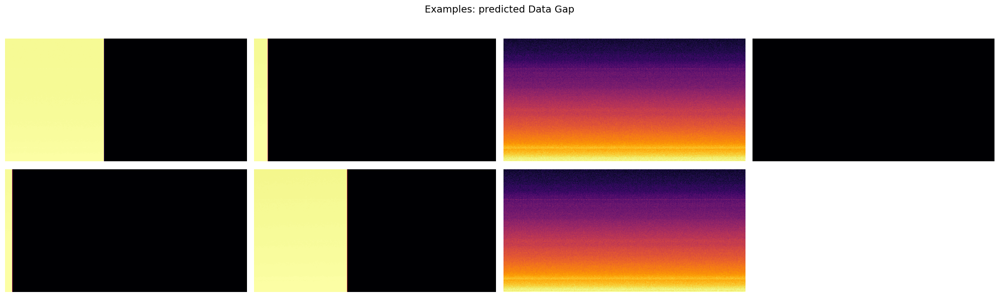

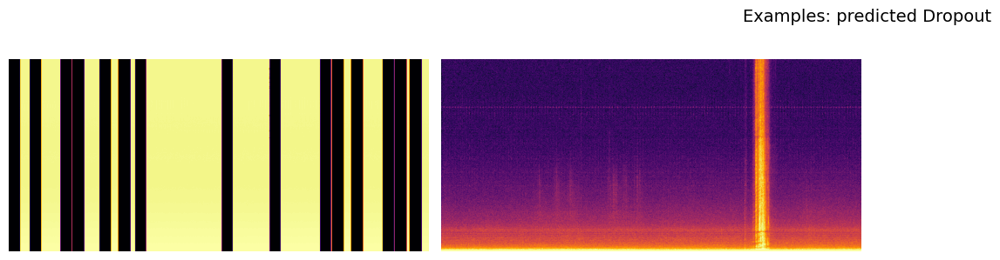

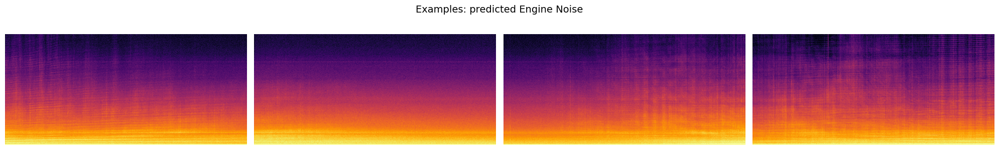

No examples for Examples: predicted Rain
No examples for Examples: predicted Sensitivity


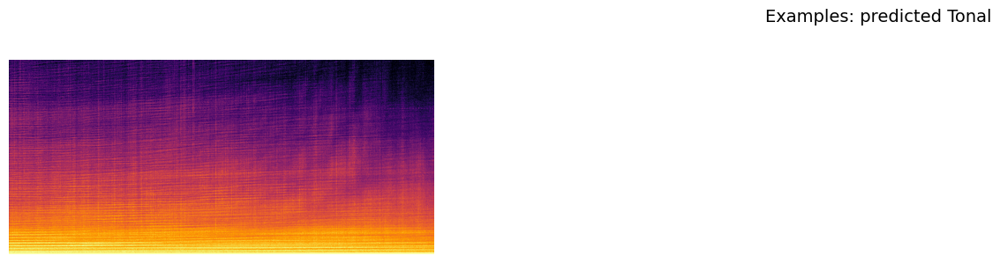

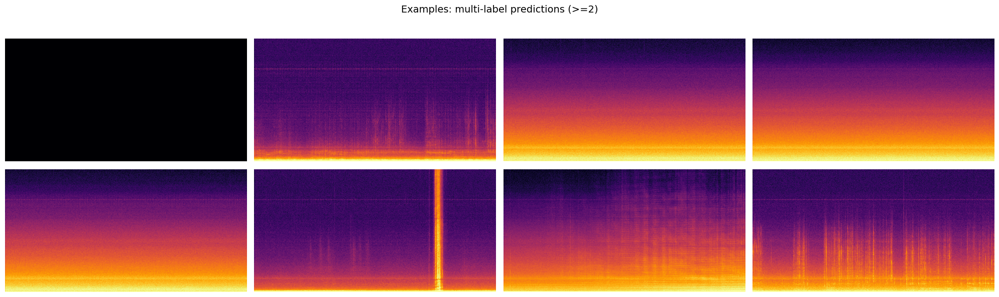

In [8]:
# Sample spectrogram grids per predicted class and multi-label cases

import random

def show_examples(paths, indices, title, k=8, samples_per_row=4):
    idxs = [i for i in indices if i < len(paths)]
    if not idxs:
        print(f"No examples for {title}")
        return
    idxs = random.sample(idxs, min(k, len(idxs)))
    rows = int(np.ceil(len(idxs) / samples_per_row))
    plt.figure(figsize=(5 * samples_per_row, 3 * rows))
    plt.suptitle(title, fontsize=14)
    for j, i in enumerate(idxs):
        plt.subplot(rows, samples_per_row, j + 1)
        arr = load_mat_spectrogram(paths[i], EXPECTED_SHAPE)
        if arr is None:
            continue
        arr = normalize_spectrogram(arr)
        arr = np.expand_dims(arr, axis=-1)
        arr = np.transpose(arr, (2, 0, 1))
        plt.imshow(arr[0], origin='lower', aspect='auto', cmap='inferno')
        plt.xlabel(Path(paths[i]).name, fontsize=7)
        plt.axis('off')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Per-class examples (using argmax label)
for c, name in enumerate(class_names):
    indices = list(np.where(preds == c)[0])
    show_examples(mat_paths, indices, f"Examples: predicted {name}")

# Multi-label examples (thresholded)
ml_idxs = list(np.where(y_pred_bin.sum(axis=1) >= 2)[0])
show_examples(mat_paths, ml_idxs, "Examples: multi-label predictions (>=2)")


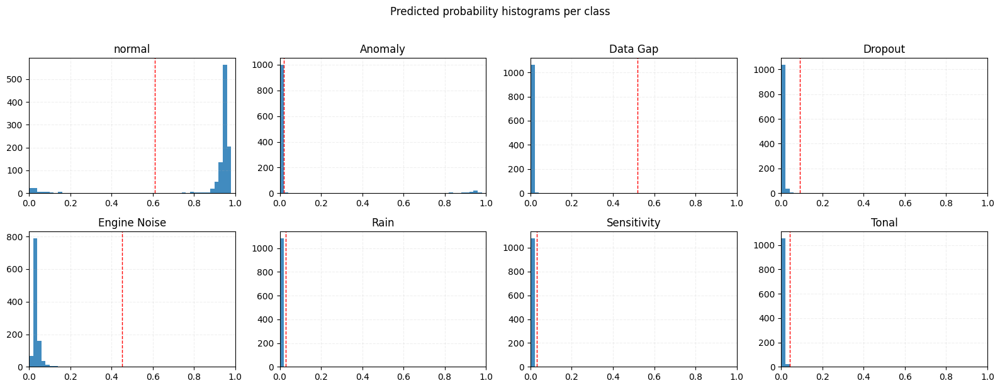

In [9]:
# Histograms of predicted probabilities per class
import math

if 'probs' not in globals():
    raise RuntimeError("'probs' not found. Run inference cell first.")

C = probs.shape[1]
cols = min(4, C)
rows = math.ceil(C / cols)
plt.figure(figsize=(4 * cols, 3 * rows))

for c in range(C):
    ax = plt.subplot(rows, cols, c + 1)
    vals = probs[:, c]
    ax.hist(vals, bins=50, range=(0.0, 1.0), alpha=0.85, color='tab:blue')
    ax.set_title(class_names[c])
    ax.set_xlim(0.0, 1.0)
    # Overlay per-class threshold if available
    if 'per_class_thresholds' in globals() and isinstance(per_class_thresholds, np.ndarray) and len(per_class_thresholds) == C:
        ax.axvline(float(per_class_thresholds[c]), color='red', linestyle='--', linewidth=1)
    ax.grid(alpha=0.2, linestyle='--')

plt.suptitle('Predicted probability histograms per class', y=1.02)
plt.tight_layout()
plt.show()


In [10]:
# Optional validation against labels.json in parent folder of MAT_FILES_DIR
from pathlib import Path
import json
from sklearn.metrics import classification_report, f1_score

labels_json_path = Path(MAT_FILES_DIR).parent / 'labels.json'
print('Looking for labels at:', labels_json_path)

if labels_json_path.exists():
    with open(labels_json_path, 'r') as f:
        labels_dict = json.load(f)

    # Map base filename -> index within mat_paths
    name_to_idx = {Path(p).name: i for i, p in enumerate(mat_paths)}

    # Select only files present in both predictions and labels.json
    sel_indices = []
    gt_lists = []
    for fname, labs in labels_dict.items():
        if fname in name_to_idx:
            sel_indices.append(name_to_idx[fname])
            gt_lists.append(labs if isinstance(labs, list) else [])

    if len(sel_indices) == 0:
        print('No overlapping files between mat_paths and labels.json entries.')
    else:
        C = len(class_names)
        label_to_index = {name: i for i, name in enumerate(class_names)}

        def normalize_label(label: str):
            if label is None or label == '':
                return None
            norm = str(label).strip()
            low = norm.lower()
            if low in ['unknown', 'unknown feature', 'unknown features']:
                return 'Anomaly'
            return norm

        # Build multi-label truth for the selected subset
        y_true_ml = np.zeros((len(sel_indices), C), dtype=int)
        primary_true = []  # for single-label per-class report
        for j, labs in enumerate(gt_lists):
            if labs is None:
                labs = []
            for lab in labs:
                lab = normalize_label(lab)
                if lab is None:
                    continue
                if lab in label_to_index:
                    y_true_ml[j, label_to_index[lab]] = 1
            # If still empty, assume normal if present in the taxonomy (legacy convention)
            if y_true_ml[j].sum() == 0 and 'normal' in label_to_index:
                y_true_ml[j, label_to_index['normal']] = 1
            primary_true.append(np.argmax(y_true_ml[j]) if y_true_ml[j].sum() == 1 else None)

        # Slice predictions for this subset
        sel_preds = preds[sel_indices]
        sel_probs = probs[sel_indices]

        # Hit@1 (top-1 within true label set)
        hits = [1 if y_true_ml[i, sel_preds[i]] == 1 else 0 for i in range(len(sel_indices))]
        hit_at1 = float(np.mean(hits))
        print(f'Hit@1 on labeled subset: {hit_at1:.4f} (n={len(sel_indices)})')

        # Multi-label F1 with per-class thresholds if available
        if 'per_class_thresholds' in globals() and isinstance(per_class_thresholds, np.ndarray) and len(per_class_thresholds) == C:
            y_pred_bin = (sel_probs >= per_class_thresholds.reshape(1, -1)).astype(int)
            thr_name = 'per-class'
        else:
            y_pred_bin = (sel_probs >= 0.5).astype(int)
            thr_name = 'global t=0.5'

        f1_micro = f1_score(y_true_ml, y_pred_bin, average='micro', zero_division=0)
        f1_macro = f1_score(y_true_ml, y_pred_bin, average='macro', zero_division=0)
        print(f'Multi-label ({thr_name}): micro-F1={f1_micro:.4f} | macro-F1={f1_macro:.4f}')

        # Per-class report on single-label items only
        mask_single = np.array([t is not None for t in primary_true])
        if mask_single.any():
            y_true_single = np.array([t for t in primary_true if t is not None], dtype=int)
            y_pred_single = sel_preds[mask_single]
            # Restrict report to classes present in y_true/y_pred for this subset
            present_labels = sorted(np.unique(np.concatenate([y_true_single, y_pred_single])))
            present_names = [class_names[i] for i in present_labels]
            print('Single-label per-class report (subset):')
            print('Present classes:', present_names)
            print(classification_report(
                y_true_single,
                y_pred_single,
                labels=present_labels,
                target_names=present_names,
                digits=4,
                zero_division=0,
            ))
        else:
            print('No single-label samples found for per-class report.')
else:
    print('labels.json not found; skipping validation.')



Looking for labels at: /mnt/z/CIOOS_Anomaly_detection_work/EndeavourKEMFHH1/labels.json
Hit@1 on labeled subset: 0.8353 (n=85)
Multi-label (per-class): micro-F1=0.8715 | macro-F1=0.2297
Single-label per-class report (subset):
Present classes: ['normal', 'Anomaly', 'Data Gap', 'Dropout', 'Engine Noise', 'Tonal']
              precision    recall  f1-score   support

      normal     0.0000    0.0000    0.0000         0
     Anomaly     1.0000    0.8375    0.9116        80
    Data Gap     0.0000    0.0000    0.0000         0
     Dropout     0.0000    0.0000    0.0000         0
Engine Noise     1.0000    0.8000    0.8889         5
       Tonal     0.0000    0.0000    0.0000         0

    accuracy                         0.8353        85
   macro avg     0.3333    0.2729    0.3001        85
weighted avg     1.0000    0.8353    0.9102        85



In [ ]:
# Save figures and CSV

results.to_csv(OUTPUT_DIR / 'predictions.csv', index=False)
label_counts_df.to_csv(OUTPUT_DIR / 'label_distribution.csv', index=False)

print('Saved predictions and label distribution.')


/tmp/ipykernel_1591/4012668095.py:47: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.95])


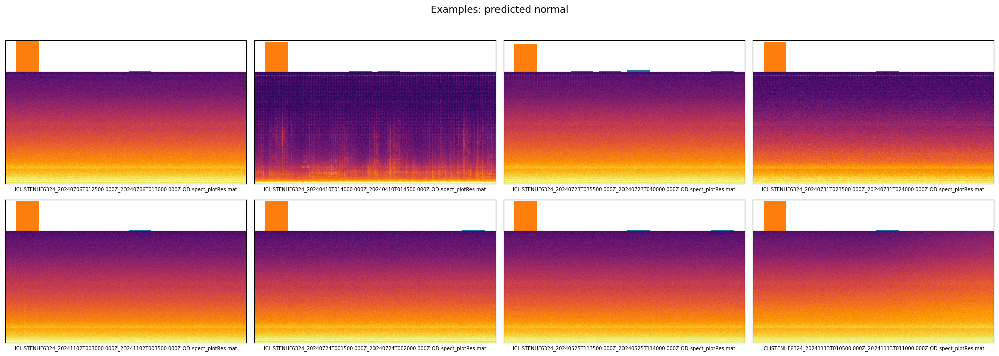

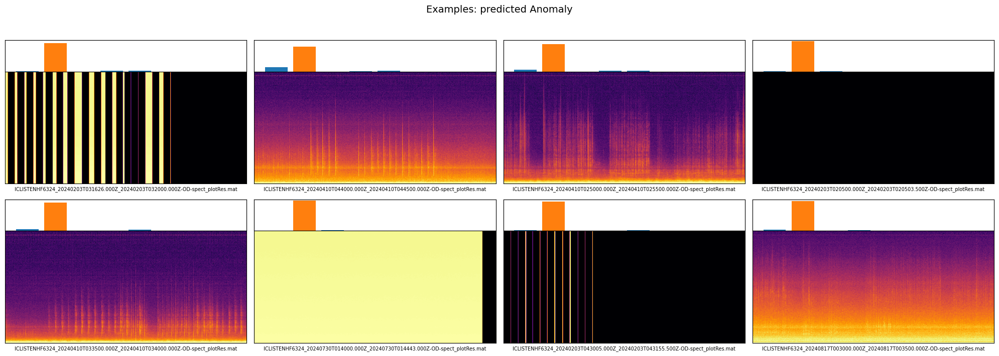

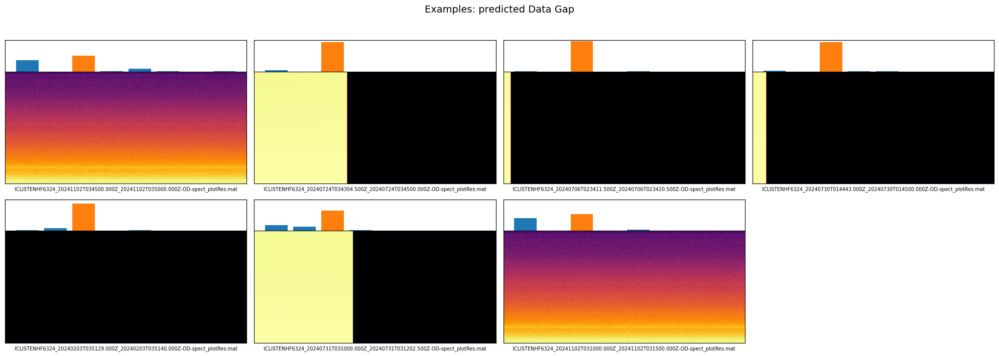

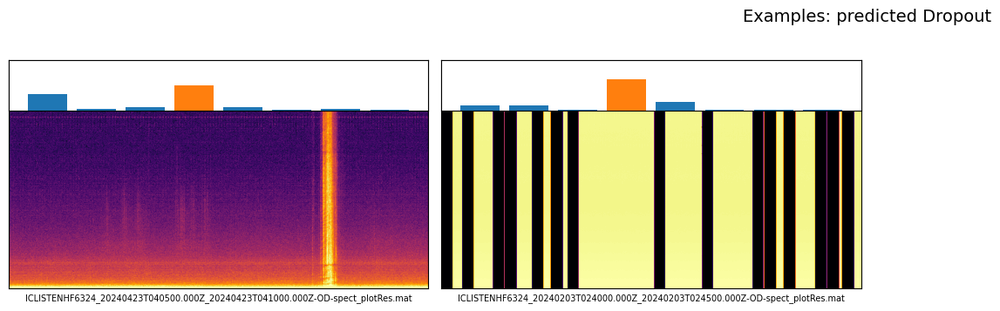

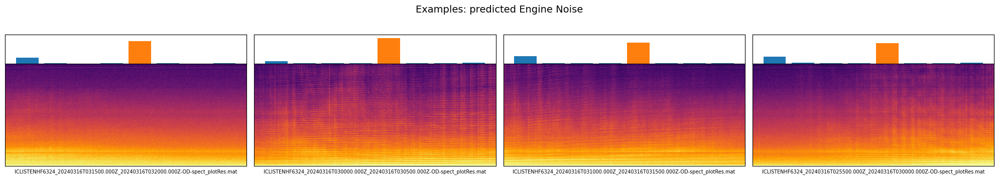

No examples for Examples: predicted Rain
No examples for Examples: predicted Sensitivity


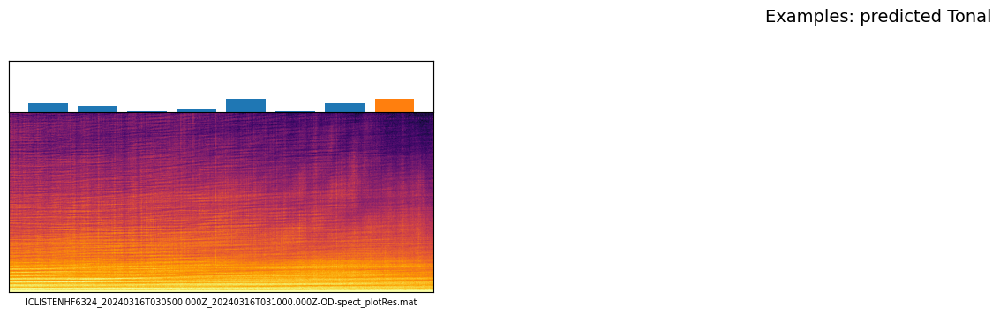

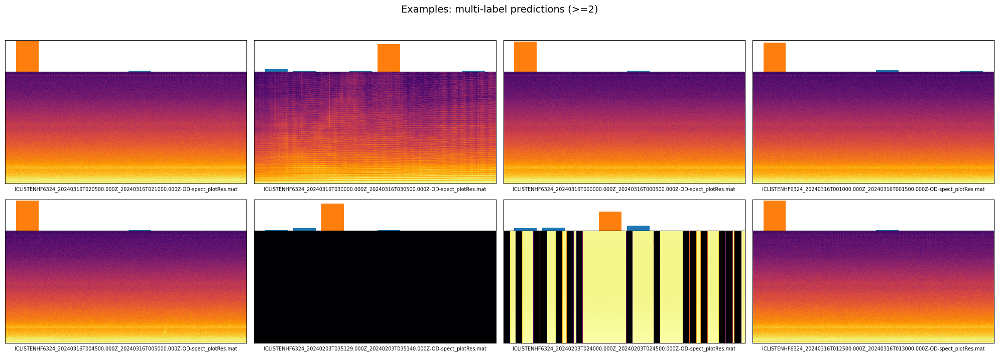

In [ ]:
# Redefine show_examples to include per-class probability bars above each spectrogram
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import random

def show_examples(paths, indices, title, k=8, samples_per_row=4):
    if 'probs' not in globals() or 'class_names' not in globals():
        raise RuntimeError("'probs' and 'class_names' must be defined (run inference first)")

    idxs = [i for i in indices if 0 <= i < len(paths) and i < len(probs)]
    if not idxs:
        print(f"No examples for {title}")
        return
    idxs = random.sample(idxs, min(k, len(idxs)))
    rows = int(np.ceil(len(idxs) / samples_per_row))

    plt.figure(figsize=(5 * samples_per_row, 3.6 * rows))
    plt.suptitle(title, fontsize=14)

    for j, i in enumerate(idxs):
        ax = plt.subplot(rows, samples_per_row, j + 1)

        # Load and normalize spectrogram for display
        arr = load_mat_spectrogram(paths[i], EXPECTED_SHAPE)
        if arr is None:
            continue
        arr = normalize_spectrogram(arr)
        ax.imshow(arr, origin='lower', aspect='auto', cmap='inferno')
        ax.set_xlabel(Path(paths[i]).name, fontsize=7)
        ax.set_xticks([])
        ax.set_yticks([])

        # Inset bar chart for per-class probabilities
        iax = inset_axes(ax, width="100%", height="22%", loc='upper center',
                         bbox_to_anchor=(0.0, 0.0, 1.0, 1.0), bbox_transform=ax.transAxes, borderpad=0)
        p = probs[i]
        x_pos = np.arange(len(class_names))
        iax.bar(x_pos, p, color='tab:blue')
        iax.set_ylim(0.0, 1.0)
        iax.set_xticks([])
        iax.set_yticks([])
        # Add tiny class labels above bars
        for _xi, _name, _val in zip(x_pos, class_names, p):
            iax.text(_xi, min(1.0, float(_val) + 0.02), _name, ha='center', va='bottom', fontsize=6, rotation=90)
        # Highlight predicted class
        try:
            pred_idx_i = int(np.argmax(p))
            iax.bar(pred_idx_i, p[pred_idx_i], color='tab:orange')
        except Exception:
            pass

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Re-run example grids using the updated function
for c, name in enumerate(class_names):
    indices = list(np.where(preds == c)[0])
    show_examples(mat_paths, indices, f"Examples: predicted {name}")

ml_idxs = list(np.where(y_pred_bin.sum(axis=1) >= 2)[0])
show_examples(mat_paths, ml_idxs, "Examples: multi-label predictions (>=2)")
